<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe09.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 09** Detekcija objekata na fotografijama I


## Sadržaj

1. Uvod
2. Detekcija ljudi pomoću HOG/SVM
3. Detekcija pomoću Yolo V3
4. Detekcija pomoću Faster-RCNN 
5. Detekcija pomoću Mask-RCNN






### Uvod

Detekcija objekata je zadatak obrade fotografije/kompjuterske vizije koji otkriva (semantičke) instance objekata koje odgovaraju datom tipu (npr. lica, ljudi, vozila i zgrade) na fotografijama. 

Predstavićemo primenu nekoliko najsavremenijih tehnika detekcije objekata. 

Sledeći zadaci obrade fotografija međusobno su povezani (iako se odnose na različite zadatke): klasifikacija fotografija, lokalizacija objekata i detekcija objekata. 

Klasifikacija fotografija ima za cilj da predvidi oznaku klase za fotografiju, dok se lokalizacija objekta bavi identifikovanjem lokacija i crtanjem graničnih okvira oko objekta na fotografiji. 

Detekcija objekata kombinuje ova dva zadatka (klasifikacija + lokalizacija) - crta granični okvir oko svakog objekta (može biti više objekata) od interesa na fotografiji i svakom od njih dodeljuje oznaku klase. Svi ovi problemi su zajednički poznati kao prepoznavanje objekata. 

Prikaz razlike između ovih tehnika:


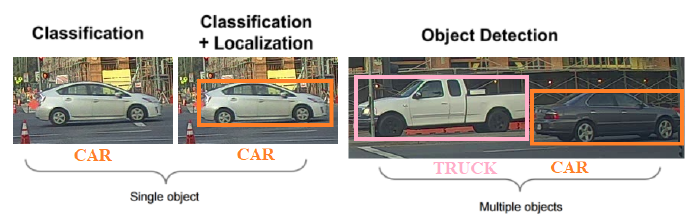

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip
- učitati models.zip

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1xytD9qBNugjASJZsjC_Laftqc6VxPRPi' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1xytD9qBNugjASJZsjC_Laftqc6VxPRPi" -O images.zip && rm -rf /tmp/cookies.txt

--2021-05-06 15:50:47--  https://docs.google.com/uc?export=download&confirm=P5NN&id=1xytD9qBNugjASJZsjC_Laftqc6VxPRPi
Resolving docs.google.com (docs.google.com)... 108.177.121.113, 108.177.121.138, 108.177.121.100, ...
Connecting to docs.google.com (docs.google.com)|108.177.121.113|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-4c-docs.googleusercontent.com/docs/securesc/kq91i0s5jedoff1qaskg2oktvf2t7c4j/e4av3n7ah611lebkbu8vb2r42o5rfmjd/1620316200000/07050430151874469418/09006564819210862740Z/1xytD9qBNugjASJZsjC_Laftqc6VxPRPi?e=download [following]
--2021-05-06 15:50:47--  https://doc-0s-4c-docs.googleusercontent.com/docs/securesc/kq91i0s5jedoff1qaskg2oktvf2t7c4j/e4av3n7ah611lebkbu8vb2r42o5rfmjd/1620316200000/07050430151874469418/09006564819210862740Z/1xytD9qBNugjASJZsjC_Laftqc6VxPRPi?e=download
Resolving doc-0s-4c-docs.googleusercontent.com (doc-0s-4c-docs.googleusercontent.com)... 74.125.129.132, 2607:f8b0:4001:c15::84
Connec

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1BkBAq7frYX3as0OC58NNF8iIQFaFs6Qw' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1BkBAq7frYX3as0OC58NNF8iIQFaFs6Qw" -O models.zip && rm -rf /tmp/cookies.txt

--2021-05-06 15:50:52--  https://docs.google.com/uc?export=download&confirm=EglF&id=1BkBAq7frYX3as0OC58NNF8iIQFaFs6Qw
Resolving docs.google.com (docs.google.com)... 172.217.214.101, 172.217.214.138, 172.217.214.102, ...
Connecting to docs.google.com (docs.google.com)|172.217.214.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-bg-docs.googleusercontent.com/docs/securesc/8eg0h1s74it248t3in6ljc17i2g2uf6e/0jonp9b1cb5fnrdnc1v8ab4f8nighfqn/1620316200000/07050430151874469418/13974099921819415973Z/1BkBAq7frYX3as0OC58NNF8iIQFaFs6Qw?e=download [following]
--2021-05-06 15:50:52--  https://doc-10-bg-docs.googleusercontent.com/docs/securesc/8eg0h1s74it248t3in6ljc17i2g2uf6e/0jonp9b1cb5fnrdnc1v8ab4f8nighfqn/1620316200000/07050430151874469418/13974099921819415973Z/1BkBAq7frYX3as0OC58NNF8iIQFaFs6Qw?e=download
Resolving doc-10-bg-docs.googleusercontent.com (doc-10-bg-docs.googleusercontent.com)... 74.125.129.132, 2607:f8b0:4001:c15::84
Connec

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/all.png          
  inflating: images/all_faces.png    
  inflating: images/bar1.png         
 extracting: images/bar2.png         
  inflating: images/beatles.png      
  inflating: images/book_cover.png   
  inflating: images/book_cover_barcode.png  
  inflating: images/book_cover_barcode_detected.png  
  inflating: images/car_multi_tracker_out.png  
  inflating: images/detected_lanes_out.png  
  inflating: images/east.png         
  inflating: images/east_tesseract.png  
  inflating: images/frcnn.png        
  inflating: images/hog.png          
  inflating: images/iou.png          
  inflating: images/lane1.png        
 extracting: images/lane2.png        
  inflating: images/mrcnn.png        
  inflating: images/mytable.png      
  inflating: images/object_detection.png  
  inflating: images/object_detection_dl.png  
  inflating: images/road.mp4         
  inflating: images/road.png         
  inflating: images/road_fas

In [ ]:
!unzip models.zip

Archive:  models.zip
   creating: models/
   creating: models/face_detect/
  inflating: models/face_detect/haarcascade_eye.xml  
  inflating: models/face_detect/haarcascade_frontalface_alt2.xml  
  inflating: models/face_detect/haarcascade_smile.xml  
  inflating: models/face_detect/opencv_face_detector.pbtxt  
  inflating: models/face_detect/opencv_face_detector_uint8.pb  
   creating: models/faster_rcnn/
  inflating: models/faster_rcnn/frozen_inference_graph.pb  
  inflating: models/faster_rcnn/image_info_test2017.json  
   creating: models/mask_rcnn/
  inflating: models/mask_rcnn/colors.txt  
  inflating: models/mask_rcnn/frozen_inference_graph.pb  
  inflating: models/mask_rcnn/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt  
  inflating: models/mask_rcnn/mscoco_labels.names  
   creating: models/text_detect/
  inflating: models/text_detect/frozen_east_text_detection.pb  
   creating: models/yolov3/
  inflating: models/yolov3/coco_classes.txt  
  inflating: models/yolov3/yolov3.cfg  

### People Detection with HOG/SVM // Detekcija ljudi pomoću HOG/SVM

Popularni deskriptor karakteristika za otkrivanje objekata je histogram orijentisanih gradijenata (HOG). 
HOG deskriptori mogu se izračunati iz fotografije tako što se prvo izračunaju horizontalni i vertikalni gradijentni fotografije, zatim se izračunavaju histogrami gradijenta i normalizuju se preko blokova, i na kraju se izravna u vektor deskriptora obeležja. Ovi konačno normalizovani deskriptori blokova nazivaju se HOG deskriptori, deskriptori karakteristika koji se koriste u raznim aplikacijama kompjuterske vizije i obrade fotografija za otkrivanje objekata.

Upotreba HOG deskriptora bila je posebno uspešna za otkrivanje ljudi, životinja, lica i teksta. Već smo opisali kako izračunati HOG deskriptor iz fotografije.

U početku se model binarnog klasifikatora (linearnog) *Support Vector Machine* (SVM) obučava sa nekoliko pozitivnih i negativnih fotografija primera treninga. 

- Pozitivne fotografije su primeri koji sadrže objekat koji želimo da otkrijemo. 
- Negativni set treninga može biti bilo koja fotografija koja ne sadrži objekat koji želimo da otkrijemo.

 Pozitivne i negativne fotografije izvora pretvaraju se u deskriptore HOG bloka. SVM trener bira najbolju granicu hiperravni/odluke (definisanu pomoću skupa vektora podrške) da razdvoji pozitivne i negativne primere u skupu podataka trening fotografije.

Vektori podrške se kasnije koriste od strane SVM modela za klasifikaciju blokova HOG-deskriptora iz probne fotografije radi otkrivanja prisustva/odsustva objekta.

Klasifikacija se tradicionalno izvodi ponovnim korakom kliznog prozora, npr. 64 piksela širine i 128 piksela visine preko probne fotografije i računanjem HOG deskriptora. Kako izračunavanje HOG deskriptora nema svojstveni osećaj razmere i s obzirom da se objekti mogu pojaviti na više skala unutar fotografije, izračunavanje opisa HOG se ponavlja na svakom nivou piramide skale. Faktor skaliranja između svakog nivoa u piramidi skale je obično između 1,05 i 1,2 i fotografija se više puta smanjuje sve dok skalirana izvorna fotografija više ne može da primi kompletan HOG prozor. Ako SVM klasifikator predviđa otkrivanje objekta u bilo kojoj meri, vraća se odgovarajući granični okvir. 

Sledeći dijagram prikazuje tipičan tok rada otkrivanja HOG objekta (čoveka):




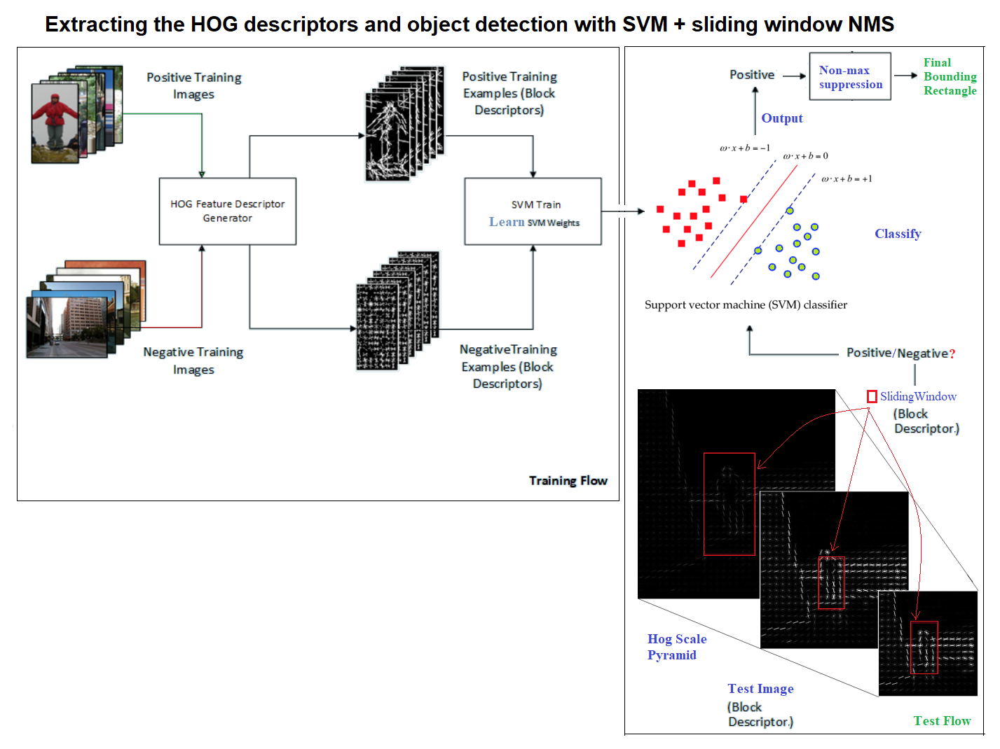

- HOG deskriptori iz ulazne fotografije izračunavaju se, a zatim unose u prethodno obučeni SVM klasifikator (dobijen pomoću cv2-ovog *HOGDescriptor_getDefaultPeopleDetector()*), koji je korišćen za predviđanje prisustva ili odsustva osobe u ili iz bloka fotografije na više skala pomoću *detectMultiScale()* funkcije.

- Objekti su otkriveni više puta u različitim razmerama i spojeni su zajedno koristeći potiskivanje bez maksimuma.

- Pozvana je funkcija *non_max_suppression()* da bi se izbeglo otkrivanje istog objekta u više navrata i na skali.

- IoU je korišćen ne-maksimalnim potiskivanjem za izračunavanje količine preklapanja dva različita ograničavajuća okvira, B1 i B2. IoU je definisan na sledeći način:


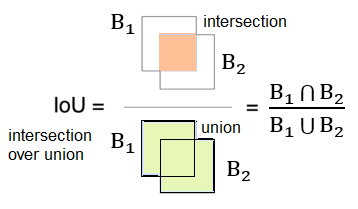

Ako je IoU nizak (korišćen je prag od 0,2), odnosno nema puno preklapanja, onda postoji velika verovatnoća da dve različite granične kutije odgovaraju dvema otkrivenim osobama. Nijedno od predviđanja graničnog okvira se ne odbacuje algoritmom suzbijanja maksimuma; u suprotnom, jedna od ograničavajućih kutija se odbacuje. Konačni ograničavajući okviri se crtaju na vrhu fotografije, a otkriveni objekti (ljudi) označavaju se okvirima (crveni pravougaonici).

51


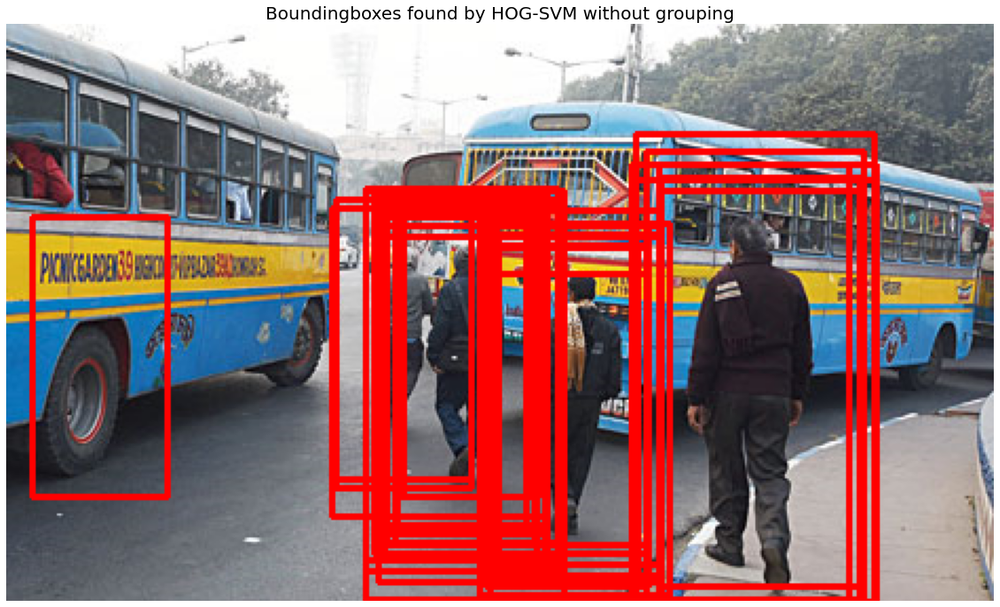

51
4


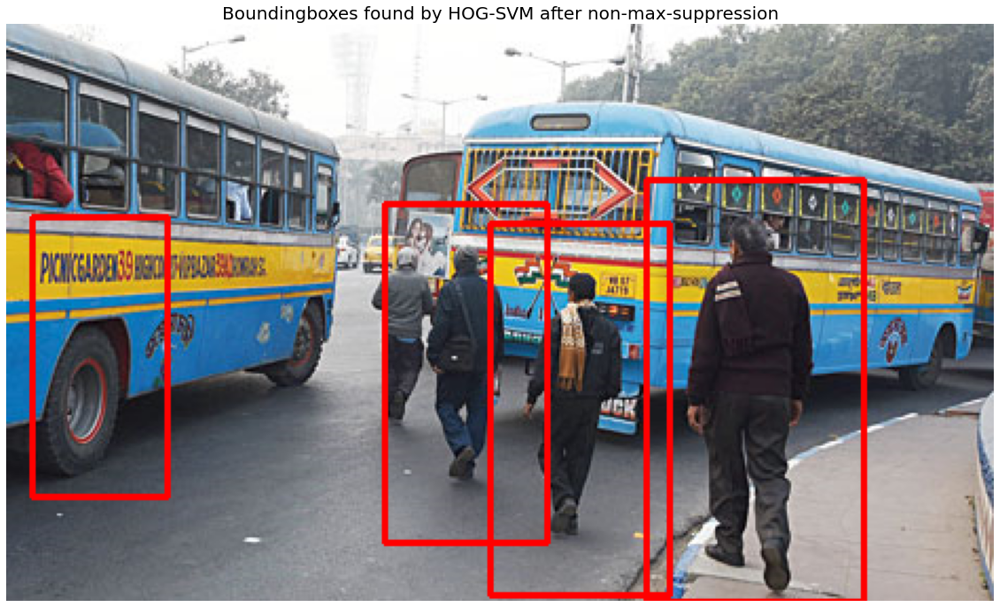

3


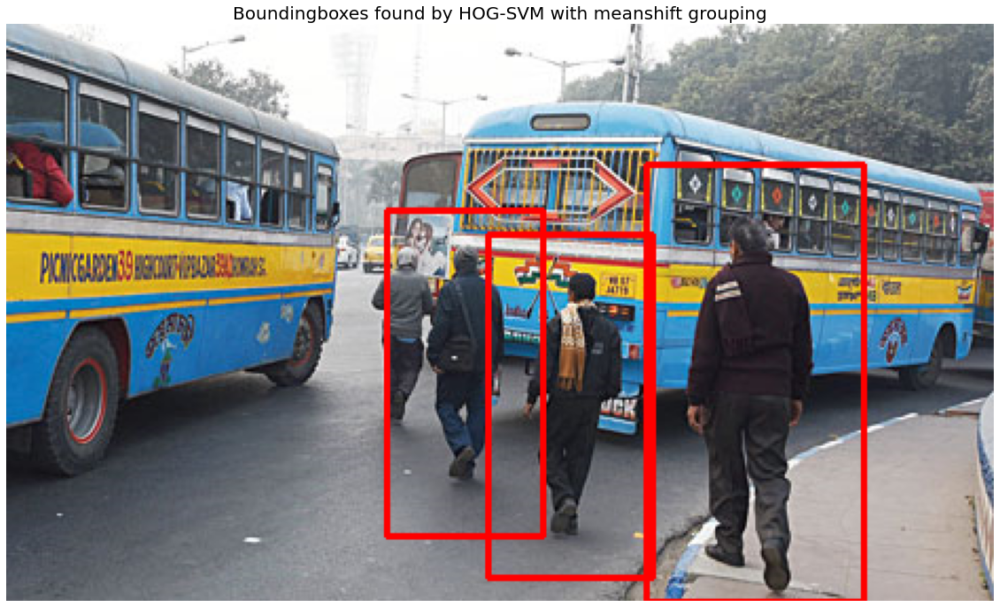

In [ ]:
import numpy as np
import cv2
import matplotlib.pylab as plt

img = cv2.imread("images/walk.png")
# Inicijalizacija HOG deskriptora 
hog = cv2.HOGDescriptor()

# Inicijalizacija SVM detektora
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

"""
Pokrenite algoritam detekcije sa prostornim korakom od 4 piksela (horizontalni i vertikalni),
korak skale od 1,1 i bez grupisanja pravougaonika.
"""
(found_bounding_boxes, weights) = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.1, finalThreshold=0)
print(len(found_bounding_boxes)) # 51

# Kopirajte originalnu fotografiju da biste za sada na njoj nacrtali ograničavajuće okvire
img_with_waw_bboxes = img.copy()
for (hx, hy, hw, hh) in found_bounding_boxes:
    cv2.rectangle(img_with_waw_bboxes, (hx, hy), (hx + hw, hy + hh), (0, 0, 255), 2)
plt.figure(figsize=(20, 12))
img_with_waw_bboxes = cv2.cvtColor(img_with_waw_bboxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_waw_bboxes, aspect='auto'), plt.axis('off')
plt.title('Boundingboxes found by HOG-SVM without grouping', size=20)
plt.show()


# Funkcija za primenu suzbijanja bez maksimuma da bi se zanemarili suvišni, preklapajući ograničavajući okviri
#https://gist.github.com/CMCDragonkai/1be3402e261d3c239a307a3346360506
def non_max_suppression(boxes, scores, threshold):	
    assert boxes.shape[0] == scores.shape[0]
    # dole-levo origin
    ys1 = boxes[:, 0]
    xs1 = boxes[:, 1]
    # gore-desno target
    ys2 = boxes[:, 2]
    xs2 = boxes[:, 3]
    # Opsezi koordinata okvira su inkluzivno-inkluzivno
    areas = (ys2 - ys1) * (xs2 - xs1)
    scores_indexes = scores.argsort().tolist()
    boxes_keep_index = []
    while len(scores_indexes):
        index = scores_indexes.pop()
        boxes_keep_index.append(index)
        if not len(scores_indexes):
            break
        ious = compute_iou(boxes[index], boxes[scores_indexes], areas[index],
                           areas[scores_indexes])
        filtered_indexes = set((ious > threshold).nonzero()[0])
        scores_indexes = [
            v for (i, v) in enumerate(scores_indexes)
            if i not in filtered_indexes
        ]
    return np.array(boxes_keep_index)

# Funkcija za izračunavanje preseka nad metrikom unije (iou) za dati okvir u odnosu na sve ostale okvire
def compute_iou(box, boxes, box_area, boxes_area):
    # Ovo je IOU kutije protiv svih ostalih kutija
    assert boxes.shape[0] == boxes_area.shape[0]
    # Dobiti sve origin-ys
    # Potisnite na gore sve donje origin-xs, dok zadržavate više origin-xs
    ys1 = np.maximum(box[0], boxes[:, 0])
    # Dobiti sve origin-xs
    # Potisnite udesno sve niže origin-xs, dok zadržavate više origin-xs
    xs1 = np.maximum(box[1], boxes[:, 1])
    # Dobiti sve target-ys
    # Potisnite na dole sve više target-ys, dok zadržavate niže origin-ys
    ys2 = np.minimum(box[2], boxes[:, 2])
    # Dobiti sve target-xs
    # Potisnite ulevo sve više target-xs, dok zadržavate niže target-xs
    xs2 = np.minimum(box[3], boxes[:, 3])
    """
    Svaka površina preseka izračunava se pomoću povučenog target-x - uguranog origin-x
    množenjem povučenog target-y - potisnutog origin-y.
    Zanemarujemo područja gde bi strana preseka bila negativna, ovo se postiže tako što se dužina stranice uveća za 0.
    """
    intersections = np.maximum(ys2 - ys1, 0) * np.maximum(xs2 - xs1, 0)
    # Svaka unija je tada površina kutije dodata jedna drugoj površini kutije umanjujući njihov presek 
    unions = box_area + boxes_area - intersections
    # element wise division
    # ako je presek 0, onda je njihov odnos 0
    ious = intersections / unions
    return ious

# Otkrijte ljude na ulaznoj fotografiji pomoću funkcije detectMultiScale i nabavite odgovarajuće granične okvire
(found_bounding_boxes, weights) = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.1, finalThreshold=0)
print(len(found_bounding_boxes)) # 51
found_bounding_boxes[:,2] = found_bounding_boxes[:,0] + found_bounding_boxes[:,2]
found_bounding_boxes[:,3] = found_bounding_boxes[:,1] + found_bounding_boxes[:,3]

# Primenite non_max_suppression da biste se rešili otkrivanja duplikata
boxIndices = non_max_suppression(found_bounding_boxes, weights.ravel(), threshold=0.2)
found_bounding_boxes = found_bounding_boxes[boxIndices,:]
found_bounding_boxes[:,2] = found_bounding_boxes[:,2] - found_bounding_boxes[:,0]
found_bounding_boxes[:,3] = found_bounding_boxes[:,3] - found_bounding_boxes[:,1]
print(len(found_bounding_boxes)) # 4

# Kopirajte originalnu fotografiju da biste za sada na njoj nacrtali ograničavajuće okvire
img_with_waw_bboxes = img.copy()
for (hx, hy, hw, hh) in found_bounding_boxes:
    cv2.rectangle(img_with_waw_bboxes, (hx, hy), (hx + hw, hy + hh), (0, 0, 255), 2)
plt.figure(figsize=(20, 12))
img_with_waw_bboxes = cv2.cvtColor(img_with_waw_bboxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_waw_bboxes, aspect='auto'), plt.axis('off')
plt.title('Boundingboxes found by HOG-SVM after non-max-suppression', size=20)
plt.show()

# meanshift-grouping - da bi se oslobodili višestrukih otkrivanja istog objekta
(found_bounding_boxes, weights) = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.01, useMeanshiftGrouping=True)
print(len(found_bounding_boxes)) # 3

# Kopirajte originalnu fotografiju da biste za sada na njoj nacrtali ograničavajuće okvire
img_with_waw_bboxes = img.copy()
for (hx, hy, hw, hh) in found_bounding_boxes:
    cv2.rectangle(img_with_waw_bboxes, (hx, hy), (hx + hw, hy + hh), (0, 0, 255), 2)
plt.figure(figsize=(20, 12))
img_with_waw_bboxes = cv2.cvtColor(img_with_waw_bboxes, cv2.COLOR_BGR2RGB)
plt.imshow(img_with_waw_bboxes, aspect='auto'), plt.axis('off')
plt.title('Boundingboxes found by HOG-SVM with meanshift grouping', size=20)
plt.show()

### Object Detection with Yolo V3 (OpenCV-python) // Detekcija pomoću Yolo V3


Dat je prikaz poboljšanja srednje prosečne preciznosti tokom godina za otkrivanje objekata na fotografijama iz skupa podataka PASCAL VOC. Do 2012. godine performanse za otkrivanje objekata počele su malo da stagniraju i usporavaju. U 2013. godini pojavili su se pristupi *deep learning*-a, a performanse su od tada dobijale podsticaj, vremenom sve bolji i bolji:

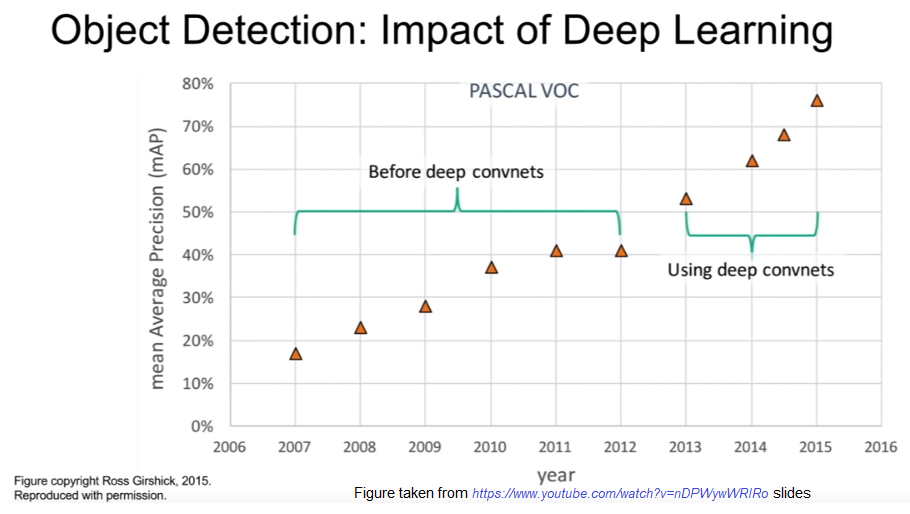

Algoritmi kao što su CNN zasnovani na regionu (na primer, *fast*/*mask* R-CNN) i YOLO razvijeni su kako bi drastično poboljšali preciznost otkrivanja objekata koristeći duboko učenje. 

Navešćemo nekoliko popularnih potpuno konvolucionih mrežnih modela za otkrivanje objekata, od kojih je jedan YOLO (*You Only Look Once*). Ovo pruža visoku stopu tačnosti u poređenju sa drugim algoritmima i radi u realnom vremenu. Kao što i samo ime govori, ovaj algoritam gleda samo jednom fotografiju, što znači da mu je potreban samo jedan prolaz za širenje unapred da bi izračunao tačna predviđanja za otkrivanje objekata na fotografiji.

Prikazaćemo kako da otkrijete objekte na fotografijama pomoću modela dubokog učenja *Fully Convolutional Network* (FCN) *deep learning model*, YOLO (v3). 
S obzirom na ulaznu fotografiju sa nekim objektima (npr. životinje i automobili), cilj će nam biti otkrivanje objekata na fotografiji sa unapred obučenim modelom YOLO (v3), sa okvirima za ograničavanje.

- U funkciji *post_process()* svi ograničavajući okviri (koje je model vratio kao izlaz) su skenirani, a potom su odbačeni oni sa niskim rezultatima pouzdanosti. Oznaka klase otkrivenog objekta odgovarala je najvećoj oceni verovatnoće. Algoritam ne-maksimalnog suzbijanja pokrenut je za odsecanje preklapajućih/suvišnih graničnih okvira.

- Funkcija *cv2.dnn.readNetFromDarknet()* korišćena je za čitanje pretreniranog Darknet modela, koristeći putanje do obezbeđene .cfg datoteke sa tekstualnim opisom mrežne arhitekture i .*weights* datoteke sa unapred obučenom mrežom, kao parametre.

- Funkcija *cv2.dnn.blobFromImage()* je korišćena za kreiranje 4D bloba (format u kojem model dubokog učenja očekuje svoj ulaz) od ulazne fotografije.

- Funkcija *net.setInput()* je korišćena za podešavanje ulaza na mrežu.

- Funkcija *net.forward()* je korišćena za pokretanje prosleđivanja unapred i dobijanje izlaza na izlaznim slojevima.

- Funkcija *post_process()* je korišćena za uklanjanje preklapajućih graničnih okvira i onih graničnih okvira sa niskom pouzdanošču (manjom od predviđenog praga pouzdanosti).

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights -P models/yolov3

--2021-05-06 14:17:18--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘models/yolov3/yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  23.0MB/s    in 11s     

2021-05-06 14:17:30 (21.1 MB/s) - ‘models/yolov3/yolov3.weights’ saved [248007048/248007048]



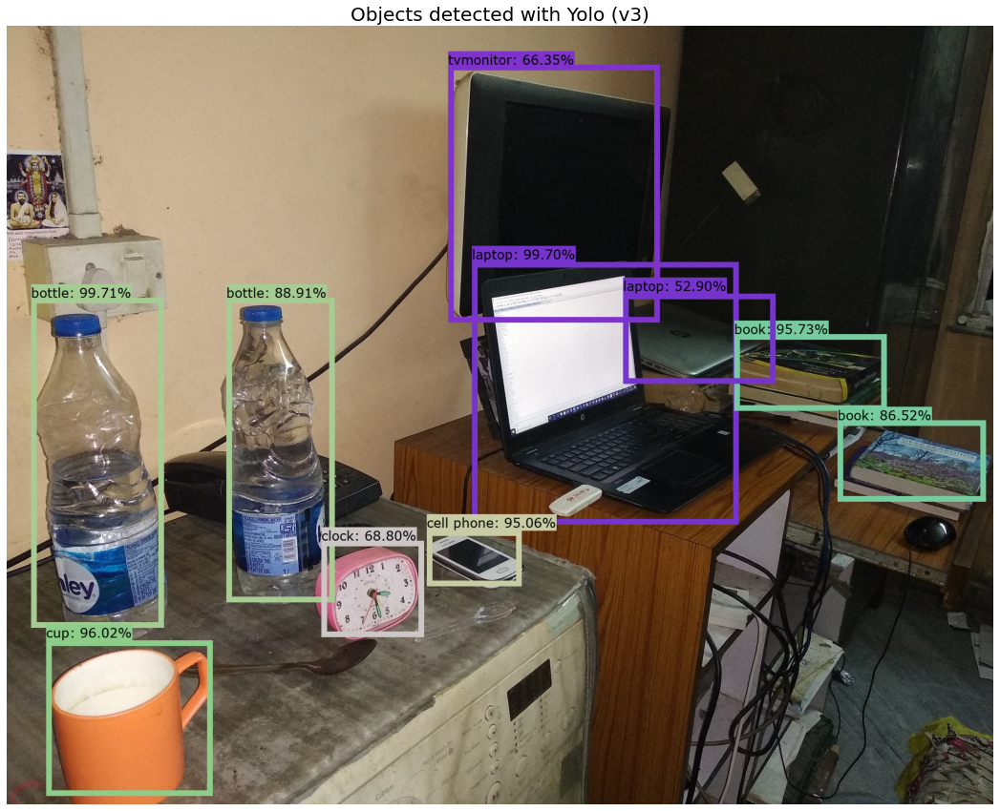

In [ ]:
# https://pjreddie.com/darknet/yolo/
import cv2
import numpy as np
import matplotlib.pylab as plt
from PIL import Image, ImageDraw, ImageFont
import colorsys
from random import shuffle

# Inicijalizacija parametara
conf_threshold = 0.5  # Prag pouzdanosti
nms_threshold = 0.4   # Non-maximum prag suzbijanja
width = 416       # Širina inputa
height = 416      # Visina inputa

# Učitajte nazive klasa
classes_file = "models/yolov3/coco_classes.txt";
classes = None
with open(classes_file, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Učitavanje datoteka konfiguracije i težine za model
model_configuration = "models/yolov3/yolov3.cfg"
model_weights = "models/yolov3/yolov3.weights"

# Učitajte prethodno obučeni model duboke neuronske mreže sa datotekama konfiguracije i težine Darknet modela
net = cv2.dnn.readNetFromDarknet(model_configuration, model_weights)
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

# Funkcija za dobijanje imena izlaznih slojeva
def get_output_layers(net):
    # Imena svih slojeva u mreži
    layersNames = net.getLayerNames()
    # Imena izlaznih slojeva (tj. slojeva sa nepovezanim izlazima)
    return [layersNames[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# Funkcija za iscrtavanje graničnog okvira oko predviđenog objekta (zajedno sa predviđenom oznakom klase sa pouzdanošću predviđanja)
def draw_boxes(img, class_id, conf, left, top, right, bottom):
    label = "{}: {:.2f}%".format(classes[class_id], conf * 100)
    color = tuple([int(255*x) for x in colors[class_id]])
    top = top - 15 if top - 15 > 15 else top + 15
    pil_im = Image.fromarray(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) 
    thickness = (img.shape[0] + img.shape[1]) // 300
    font = ImageFont.truetype("images/verdana.ttf", 25) 
    draw = ImageDraw.Draw(pil_im)  
    label_size = draw.textsize(label, font)
    if top - label_size[1] >= 0:
        text_origin = np.array([left, top - label_size[1]])
    else:
        text_origin = np.array([left, top + 1])
    for i in range(thickness):
        draw.rectangle([left + i, top + i, right - i, bottom - i], outline=color)
    draw.rectangle([tuple(text_origin), tuple(text_origin +  label_size)], fill=color)
    draw.text(text_origin, label, fill=(0, 0, 0), font=font)
    del draw
    img = cv2.cvtColor(np.array(pil_im), cv2.COLOR_RGB2BGR)  
    
    return img


# Uklonite granične kutije sa malom pouzdanošću koristeći non-maximum suzbijanje
def post_process(img, outs):
    heighteight = img.shape[0]
    widthidth = img.shape[1]

    class_ids = []
    confidences = []
    boxes = []
    # Skenirajte kroz sve granične okvire koji se izlaze iz mreže i zadržite samo one sa visokim rezultatima pouzdanosti. 
    # Oznaku klase dodelite kutiji kao klasi sa najvišim ocenama.
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > conf_threshold:
                center_x = int(detection[0] * widthidth)
                center_y = int(detection[1] * heighteight)
                width = int(detection[2] * widthidth)
                height = int(detection[3] * heighteight)
                left = int(center_x - width / 2)
                top = int(center_y - height / 2)
                class_ids.append(class_id)
                confidences.append(float(confidence))
                boxes.append([left, top, width, height])

    # Izvršite non-maximum suzbijanje da biste eliminisali suvišna preklapajuća polja sa nižom pouzdanošću.
    indices = cv2.dnn.NMSBoxes(boxes, confidences, conf_threshold, nms_threshold)
    for i in indices:
        i = i[0]
        box = boxes[i]
        left = box[0]
        top = box[1]
        width = box[2]
        height = box[3]
        img = draw_boxes(img, class_ids[i], confidences[i], left, top, left + width, top + height)
        
    return img

hsv_tuples = [(x/len(classes), x/len(classes), 0.8) for x in range(len(classes))]
shuffle(hsv_tuples)
colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))

img = cv2.imread('images/mytable.png')
orig = np.copy(img)

# Kreiranje bloba od ulazne fotografije
blob = cv2.dnn.blobFromImage(img, 1/255, (width, height), [0,0,0], 1, crop=False)

# Setovanje inputa u mrežu
net.setInput(blob)

# Prosleđivanje za dobijanje rezultata izlaznih slojeva
outs = net.forward(get_output_layers(net))

# Iscrtajte granične kvadrate i uklonite one sa malom pouzdanošću
img = post_process(img, outs)

fig = plt.figure(figsize=(20,15))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Objects detected with Yolo (v3)', size=20)
plt.show()

### Object Detection with Faster-RCNN (TensorFlow ResNet) // Detekcija pomoću Faster-RCNN 


*Fast* R-CNN je još jedan model detekcije objekata zasnovan na regionu koji su *Girshick* i saradnici predložili kao poboljšanje R-CNN-a (2013) i *Fast* R-CNN (2015). *Fast* R-CNN smanjuje vreme izvršavanja detekcije (npr. za sporiji R-CNN model) uvođenjem udruživanja povraćaja ulaganja, ali ipak izračunavanje predloga regiona postaje usko grlo. *Fast* R-CNN uvodi mrežu regionalnih predloga (RPN). Postiže gotovo besplatne predloge za region deleći konvolutivne karakteristike sa mrežom za otkrivanje.

Mreža za predloge regiona (RPN) je FCN (*Fully Convolutional Network*) koja predviđa regije koje potencijalno sadrže objekat sa okvirima koji ograničavaju objekte zajedno sa ocenama objektivnosti (odnosno verovatnoćom da region sadrži objekat) na svakoj poziciji. Obuka RPN-a od kraja do kraja omogućava joj da visokokvalitetno predvidi predloge za region (koristeći “sidra” i uz nedavne mehanizme pažnje). Tada *Fast* R-CNN koristi ove regione za moguće otkrivanje. RPN i *Fast* R-CNN spojeni su u jednu mrežu. Mreža je zajednički obučena sa četiri gubitka:
1. RPN pruža klasifikaciju objekta/ne-objekta (sa ocenom objektivnosti).
2. RPN koristi regresiju za izračunavanje koordinata polja.
3. Konačni klasifikator (iz *Fast* R-CNN) klasifikuje objekat (sa ocenom klasifikacije).
4. Izlazni ograničavajući okviri koji odgovaraju objektu izračunavaju se regresijom.

RPN implementira klizni prozor iznad karakteristika CNN-a. Za svaku lokaciju prozora izračunava rezultat i (po sidru) granični okvir (ako je k broj sidara, potrebne su 4k koordinate graničnog okvira). Na taj način, brži RCNN omogućava otkrivanje objekata na testnoj fotografiji u realnom vremenu. Sledeći dijagram prikazuje arhitekturu brže R-CNN mreže:


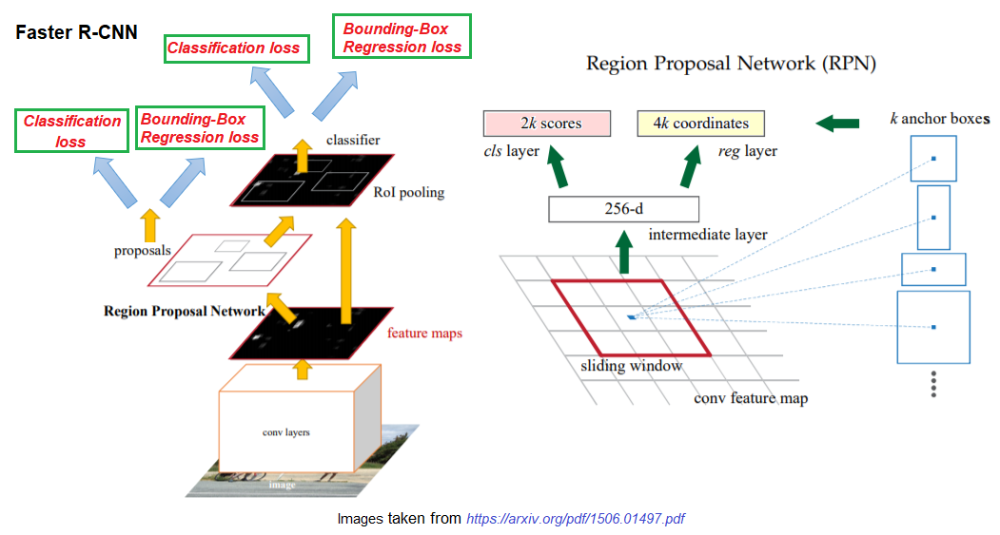

Za svaki objekat otkriven na fotografiji, izlaz sadrži sledeće:
1. Koordinate pravougaonika okvira za objekat
2. Oznake klasa dodeljene objektu
3. Verovatnoća (pouzdanost) za svaku oznaku klase za objekat

- Grafikon (računski graf) je suštinski koncept tensorflow-a za predstavljanje proračuna. *GraphDef* je serijska verzija grafikona i objekt *GraphDef* iz prethodno obučenog modela može se raščlaniti pomoću funkcije *ParseFromString()*.

- Funkcija *import_graph_def()* može se koristiti za uvoz serializovanog bafera protokola *TensorFlow GraphDef*. Izdvaja pojedinačne *GraphDef* objekte kao *tf.Tensor/tf.Operation* objekte. Jednom izvučeni, ovi objekti se postavljaju u trenutni zadati grafikon.


In [ ]:
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md
%matplotlib inline
import numpy as np
import tensorflow as tf
import cv2
from PIL import Image, ImageFont, ImageDraw
import json    
import colorsys
import matplotlib.pylab as plt

# print(tf.__version__)

# Inicijalizujte listu oznaka klasa za koje je obučen MobileNet SSD model za otkrivanje
with open('models/faster_rcnn/image_info_test2017.json','r') as r:
    js = json.loads(r.read())
labels = {i['id']:i['name'] for i in js['categories']}
print(labels)
print(len(labels)) 

# Generišite skup jedinstvenih boja za ograničavajuće okvire za svaku klasu
hsv_tuples = [(x/len(labels), 0.8, 0.8) for x in range(len(labels))]
colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
conf = 0.2

# Učitajte fotografiju
img = cv2.imread('images/road.png')

# Učitajte grafikon zaključenog modela TensorFlow
with tf.io.gfile.GFile('models/faster_rcnn/frozen_inference_graph.pb', 'rb') as f:
    graph_def = tf.compat.v1.GraphDef() #tf.GraphDef()
    graph_def.ParseFromString(f.read())

with tf.compat.v1.Session() as sess: #tf.Session() as sess:
    # Restore session
    sess.graph.as_default()
    tf.import_graph_def(graph_def, name='')

    orig = np.copy(img)

    # Prethodno obradite ulaznu fotografiju da biste je uneli u model kao ulaz, obnovili sesiju i pokrenuli prosleđivanje na modelu
    rows = img.shape[0]
    cols = img.shape[1]
    inp = cv2.resize(img, (300, 300))
    inp = inp[:, :, [2, 1, 0]]  # BGR2RGB

    # Pokretanje modela
    out = sess.run([sess.graph.get_tensor_by_name('num_detections:0'),
                    sess.graph.get_tensor_by_name('detection_scores:0'),
                    sess.graph.get_tensor_by_name('detection_boxes:0'),
                    sess.graph.get_tensor_by_name('detection_classes:0')],
                   feed_dict={'image_tensor:0': inp.reshape(1, inp.shape[0], inp.shape[1], 3)})

    # Nacrtajte granične okvire za otkrivene objekte 
    # (koje je otkrio Faster R-CNN prethodno obučeni model)
    # (gde nivo pouzdanosti premašuje graničnu pouzdanost)
    num_detections = int(out[0][0])
    print(num_detections)
    for i in range(num_detections):
        idx = int(out[3][0][i])
        #print(class_id)
        score = float(out[1][0][i])
        bbox = [float(v) for v in out[2][0][i]]
        if score > conf:
            x = bbox[1] * cols
            y = bbox[0] * rows
            right = bbox[3] * cols
            bottom = bbox[2] * rows

        # Iscrtavanje predviđenih okvira
        label = "{}: {:.2f}%".format(labels[idx], score * 100)
        color = tuple([int(255*x) for x in colors[idx]])
        y = y - 15 if y - 15 > 15 else y + 15
        pil_im = Image.fromarray(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) 
        thickness = (img.shape[0] + img.shape[1]) // 300
        font = ImageFont.truetype("images/verdana.ttf", 15) 
        draw = ImageDraw.Draw(pil_im)  
        label_size = draw.textsize(label, font)
        if y - label_size[1] >= 0:
            text_origin = np.array([x, y - label_size[1]])
        else:
            text_origin = np.array([x, y + 1])
        for i in range(thickness):
            draw.rectangle([x + i, y + i, right - i, bottom - i], outline=color)
        draw.rectangle([tuple(text_origin), tuple(text_origin +  label_size)], fill=color)
        draw.text(text_origin, label, fill=(0, 0, 0), font=font)
        del draw
        img = cv2.cvtColor(np.array(pil_im), cv2.COLOR_RGB2BGR)      

{1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light', 11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench', 16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow', 22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack', 28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee', 35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite', 39: 'baseball bat', 40: 'baseball glove', 41: 'skateboard', 42: 'surfboard', 43: 'tennis racket', 44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon', 51: 'bowl', 52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange', 56: 'broccoli', 57: 'carrot', 58: 'hot dog', 59: 'pizza', 60: 'donut', 61: 'cake', 62: 'chair', 63: 'couch', 64: 'potted plant', 65: 'bed', 67: 'dining table', 70: 'toilet', 72: 'tv', 73: 'laptop', 74: 'mouse', 75: 'remote', 76: 'keyboard', 77: 'cell phone', 78: 'micro

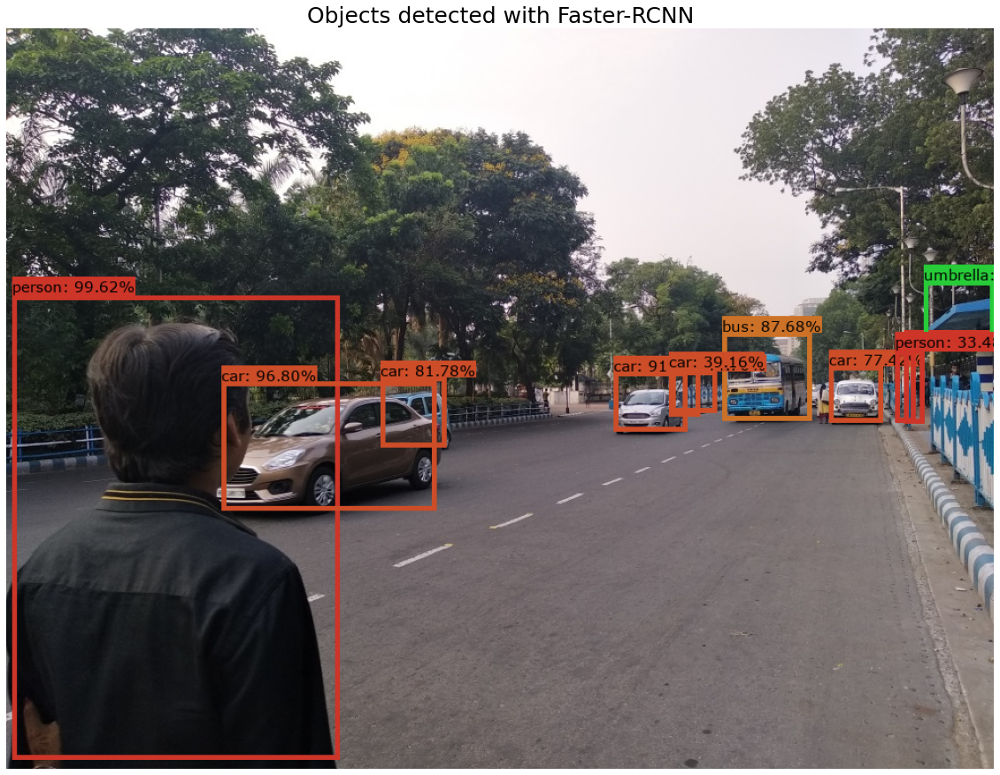

In [ ]:
# Prikaz fotografije
fig = plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Objects detected with Faster-RCNN', size=25)
plt.show()

### Object Detection with Mask-RCNN // Detekcija pomoću Mask-RCNN

Algoritam *Mask* R-CNN (2017) uključuje brojna poboljšanja u poređenju sa *Fast* R-CNN algoritmom za detekciju objekata zasnovanih na regionu, sa sledeća dva osnovna doprinosa:

1. ROI objedinjavanje zamenjuje se modulom za poravnanje ROI (što je tačnije).
2. Dodatna grana se ubacuje (koja prima izlaz od ROI *Align*, naknadno ga ubacujući u dva uzastopna konvoluciona sloja. Izlaz iz poslednjeg konvolucionog sloja čini masku objekta) na izlazu modula ROI *Align*.

Modul RoI *Align* pruža precizniju korespondenciju između regiona odabrane mape obeležja i područja ulazne fotografije. Potrebno je mnogo više finog poravnanja za segmentaciju na nivou piksela, a ne samo za računanje graničnih okvira. Dat je prikaz arhitekture *Mask* R-CNN:

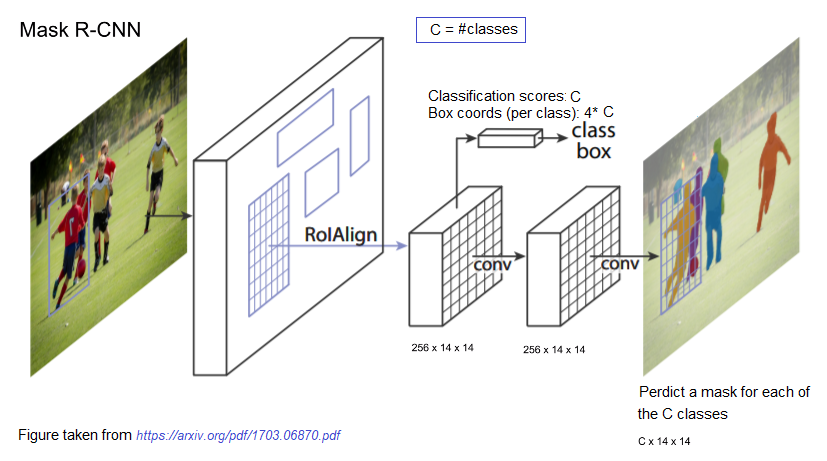

- Funkcija *draw_box()* radi sledeće:
 1. Crta granični okvir oko otkrivenog objekta.
 2. Štampa oznaku (najverovatnije) klase kojoj je objekat dodeljen.
 3. Prikazuje oznaku u gornjem levom uglu graničnog okvira.
 4. Zatim, menja veličinu maske, praga i boje i primenjuje je na fotografiju.
 5. Na kraju, crta konture na fotografiji koja odgovara masci.


- Funkcija *post_process()* izdvaja granični okvir zajedno sa maskom za svaki objekat otkriven za svaku fotografiju. Zatim bira pravu boju (koja odgovara oznaci klase objekta) da nacrta okvir za ograničavanje predmeta i prekriva masku na fotografiji.

4.1.2
(750, 1000, 3)


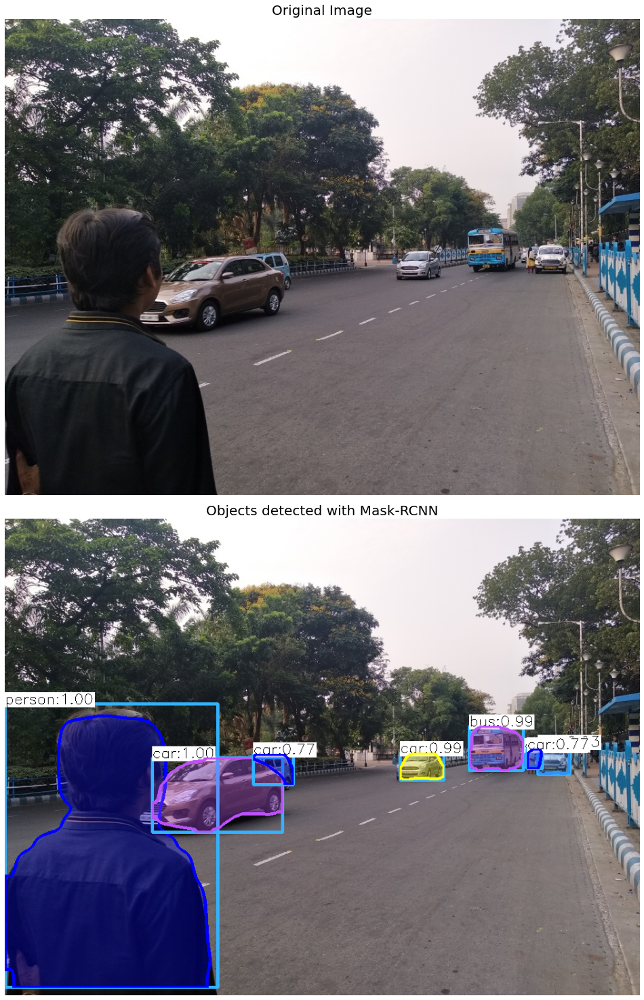

In [ ]:
# http://download.tensorflow.org/models/object_detection/mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
# https://github.com/opencv2/opencv2_extra/blob/master/testdata/dnn/download_models.py
# https://github.com/opencv2/opencv2_extra/tree/master/testdata/dnn
import cv2
import numpy as np
import os.path
import sys
import random
import matplotlib.pylab as plt

print(cv2.__version__)

# Inicijalizacija parametara
conf_threshold = 0.5  # Pouzdanost 
mask_threshold = 0.3  # Maska 

"""
Funkcija za crtanje predviđenog graničnog okvira za otkriveni objekat, 
bojenje prema predviđenoj klasi objekta i prekrivanje maske izračunate na vrhu ulazne fotografije.
"""
def draw_box(img, class_id, conf, left, top, right, bottom, class_mask):
    # Nacrtajte granični okvir
    cv2.rectangle(img, (left, top), (right, bottom), (255, 178, 50), 3)
    
    # Ispišite oznaku klase
    label = '%.2f' % conf
    if classes:
        assert(class_id < len(classes))
        label = '%s:%s' % (classes[class_id], label)
    
    # Prikažite oznaku na vrhu graničnog okvira
    label_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
    top = max(top, label_size[1])
    cv2.rectangle(img, (left, top - round(1.5*label_size[1])), (left + round(1.5*label_size[0]), top + baseline), (255, 255, 255), cv2.FILLED)
    cv2.putText(img, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (0,0,0), 1)

    # Promenite veličinu maske, prag, boju i primenite je na fotografiju
    class_mask = cv2.resize(class_mask, (right - left + 1, bottom - top + 1))
    mask = (class_mask > mask_threshold)
    roi = img[top:bottom+1, left:right+1][mask]

    # color = colors[class_id%len(colors)]
    # Comment the above line and uncomment the two lines below to generate different instance colors
    color_index = random.randint(0, len(colors)-1)
    color = colors[color_index]

    img[top:bottom+1, left:right+1][mask] = ([0.3*color[0], 0.3*color[1], 0.3*color[2]] + 0.7 * roi).astype(np.uint8)

    # Nacrtajte konture na slici
    mask = mask.astype(np.uint8)
    #im2, 
    contours, hierarchy = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img[top:bottom+1, left:right+1], contours, -1, color, 3, cv2.LINE_8, hierarchy, 100)

"""
Funkcija za naknadnu obradu rezultata dobijenih iz mreže za izdvajanje ograničavajućih okvira 
i maski koje odgovaraju otkrivenim objektima.
"""
def post_process(boxes, masks):
    """ 
    Izlazna veličina maski je NxCxHxW, gde je:
      N - broj otkrivenih kutija
      C - broj klasa (bez pozadine)
      HxW - oblik segmentacije
    """
    
    num_classes = masks.shape[1]
    num_detections = boxes.shape[2]

    height = img.shape[0]
    width = img.shape[1]

    for i in range(num_detections):
        box = boxes[0, 0, i]
        mask = masks[i]
        score = box[2]
        if score > conf_threshold:
            class_id = int(box[1])
            
            # Izvadite granični okvir
            left = int(width * box[3])
            top = int(height * box[4])
            right = int(width * box[5])
            bottom = int(height * box[6])
            
            left = max(0, min(left, width - 1))
            top = max(0, min(top, height - 1))
            right = max(0, min(right, width - 1))
            bottom = max(0, min(bottom, height - 1))
            
            # Izvadite masku za objekat
            class_mask = mask[class_id]

            # Nacrtajte granični okvir, obojite i prikažite masku na fotografiji
            draw_box(img, class_id, score, left, top, right, bottom, class_mask)


# Učitajte nazive klasa
classesFile = "models/mask_rcnn/mscoco_labels.names";
classes = None
with open(classesFile, 'rt') as f:
   classes = f.read().rstrip('\n').split('\n')

# textGraph fajl i fajl težina za model
textGraph = "models/mask_rcnn/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt";
model_weights = "models/mask_rcnn/frozen_inference_graph.pb";

# Učitajte mrežu
net = cv2.dnn.readNetFromTensorflow(model_weights, textGraph);
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

# Boje koje će se koristiti za crtanje graničnih okvira za objekte koji odgovaraju različitim klasama
colors_file = "models/mask_rcnn/colors.txt";
with open(colors_file, 'rt') as f:
    colors_str = f.read().rstrip('\n').split('\n')
colors = [] #[0,0,0]
for i in range(len(colors_str)):
    rgb = colors_str[i].split(' ')
    color = np.array([float(rgb[0]), float(rgb[1]), float(rgb[2])])
    colors.append(color)

# Učitajte ulaznu fotografiju
img = cv2.imread('images/road.png')    
print(img.shape)

orig = np.copy(img)

# Kreirajte blob od ulazne fotografije
blob = cv2.dnn.blobFromImage(img, swapRB=True, crop=False)

# Setovanje inputa u mrežu
net.setInput(blob)

# Pokrenite prosleđivanje unapred da biste dobili izlaz iz izlaznih slojeva
boxes, masks = net.forward(['detection_out_final', 'detection_masks'])

# Izdvojite granični okvir i masku za svaki od otkrivenih objekata
post_process(boxes, masks)

# Informacije o efikasnosti
t, _ = net.getPerfProfile()
#label = 'Mask-RCNN on 2.5 GHz Intel Core i7 CPU, Inference time for a img : %0.0f ms' % abs(t * 1000.0 / cv2.getTickFrequency())
#cv2.putText(img, label, (0, 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0))

fig = plt.figure(figsize=(20,20))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05) 
plt.subplot(211), plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(212), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Objects detected with Mask-RCNN', size=20)
plt.show()

![](images\text_book_cover.png)

## Korisni linkovi

1.   [non_max_suppression.py](https://gist.github.com/CMCDragonkai/1be3402e261d3c239a307a3346360506)

2.   [Histograms of Oriented Gradients for Human Detection](https://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf), Navneet Dalal and Bill Triggs

3.   [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640)

4.   [Autonomous Driving – Car detection with YOLO Model with Keras in Python](https://sandipanweb.wordpress.com/2018/03/11/autonomous-driving-car-detection-with-yolo-in-python/)

5.   [Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks](https://arxiv.org/pdf/1506.01497.pdf), Shaoqing Ren

6.   [Detectron](https://github.com/facebookresearch/Detectron)




## Reference

1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey




## TO DO

### Zadatak 1

- Izabrati fotografiju po izboru i provući je kroz sve navedene algoritme.
- Proučiti razliku u detekciji za svaki algoritam.